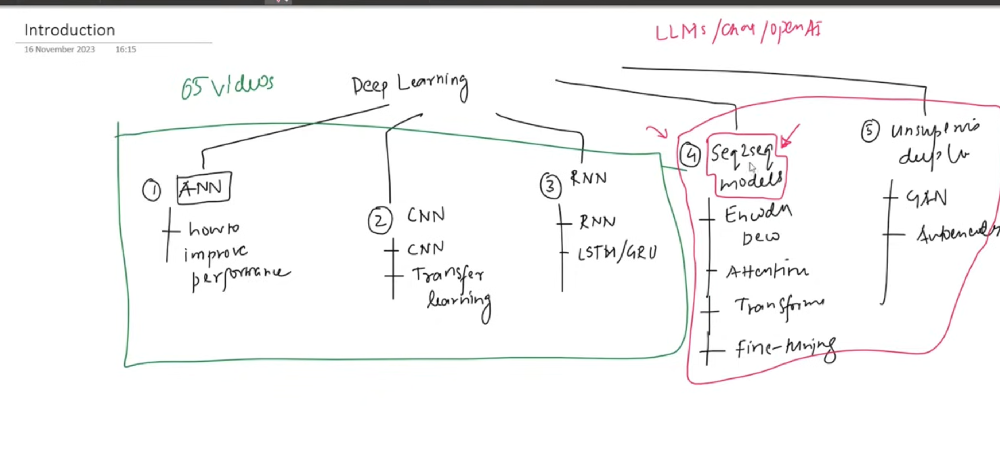

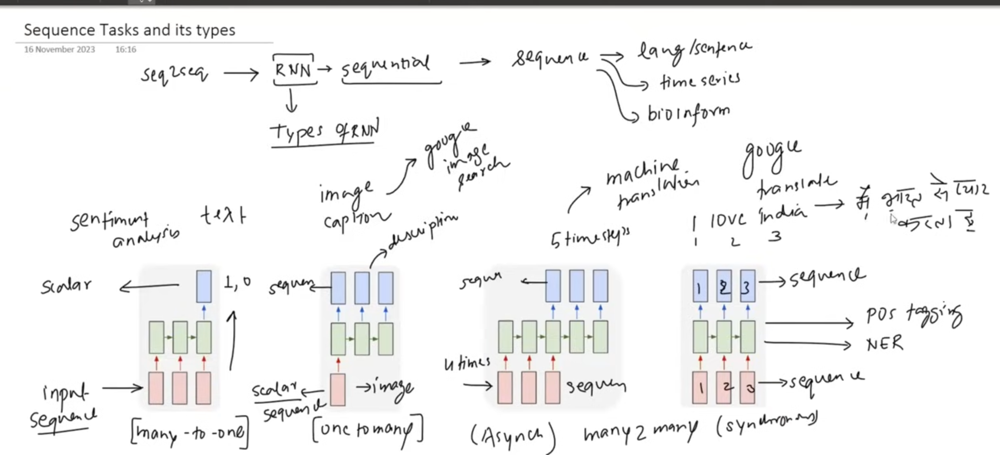



---

## Topic 1: Introduction to Sequence Data & The RNN Foundation (Context for Sequence-to-Sequence Models)

### 1. Introduction
**What it is:** Before we can understand modern Large Language Models (LLMs) like ChatGPT, we need to understand the type of data they work with: **Sequential Data**. This is data where the order of elements matters. The first major neural network architecture designed to handle this was the **RNN (Recurrent Neural Network)** .

**Why it's important:** RNNs were the foundational technology that led to Sequence-to-Sequence models. Understanding what RNNs can and cannot do is crucial to appreciating why innovations like the Attention Mechanism and Transformers were necessary.

**Real-life use:** Sequential data is everywhere. Examples include sentences in language (order of words matters), time-series data (stock prices, weather over time), and biological sequences like genes.

### 2. Detailed Explanation
#### What is Sequential Data?
Sequential data is data where the sequence or order of elements is critical to its meaning.
- **Example:** In the sentence "I love India", the order of the words "I", "love", and "India" gives the sentence its meaning. Changing the order ("India love I") changes the meaning completely.
- **Other Examples:** Time series data (stock prices over days), audio signals (speech), and DNA sequences.

#### The Three Types of RNN Architectures
The transcript explains that RNNs can be categorized into three main types based on the relationship between the input and output sequences.

| RNN Type | Input | Output | Example |
| :--- | :--- | :--- | :--- |
| **Many-to-One** | Sequence | A single value (scalar) | **Sentiment Analysis**: Input is a movie review (a sequence of words). Output is a single prediction (positive or negative sentiment). |
| **One-to-Many** | A single value (or non-sequential input) | A Sequence | **Image Captioning**: Input is a single image. Output is a textual description (a sequence of words). |
| **Many-to-Many** | Sequence | Sequence | **Synchronous (Equal Length):** **Part-of-Speech (POS) Tagging** or **Named Entity Recognition (NER)**. For every input word, you get an output tag.<br><br>**Asynchronous (Variable Length):** **Machine Translation**. The input sentence in English may have 3 words, but the output in Hindi may have 4 or 5. |

#### The Main Problem with RNNs & LSTMs
While RNNs (and their advanced version, LSTMs) were great for sequential data, they had a critical flaw: **Short-Term Memory**. When processing a very long sequence (e.g., a sentence with over 30 words), the network starts to "forget" the information from the beginning of the sequence. This is known as the **Vanishing Gradient Problem**.

### 3. Key Points
- Sequential data is any data where order is important.
- RNNs were the first major neural network to handle sequences.
- RNNs have 3 types: Many-to-One, One-to-Many, and Many-to-Many.
- Machine Translation falls under the "Many-to-Many" category with variable input/output lengths.
- RNNs and LSTMs suffer from memory issues with long sequences.

### 4. Syntax/Structure (RNN Basic Concept)
*Note: The transcript does not provide code, but describes the conceptual flow:*
- **Conceptual Flow:** Sequence of words → RNN/LSTM Cell → Process word-by-word → Update internal state (memory) → Generate output (scalar or new sequence).

### 7. Common Mistakes
- **Confusing RNN Types:** Beginners often confuse Many-to-One (used for classification) with Many-to-Many (used for generation/translation).
- **Believing LSTMs have infinite memory:** Even LSTMs struggle with very long sequences (experimentally, >30 words), which is why better architectures were developed.

### 8. Interview/Exam Questions
**Q1: What is sequential data? Give three examples.**
**A1:** Sequential data is data where the order of the elements is crucial for interpretation. Examples include sentences in NLP, time-series stock market data, and speech audio signals.

**Q2: Explain the difference between a "Many-to-One" and "Many-to-Many" RNN.**
**A2:** A Many-to-One RNN takes a sequence as input and produces a single, non-sequential output (like classifying a sentence as positive/negative). A Many-to-Many RNN takes a sequence as input and produces a sequence as output, which can be synchronous (equal length, like POS tagging) or asynchronous (variable length, like machine translation).

### 9. Revision Notes
- **Sequential Data:** Order matters. E.g., Text & Time Series.
- **RNN Type I (Many-to-One):** Sequence in → Single out (Sentiment Analysis).
- **RNN Type II (One-to-Many):** Single in → Sequence out (Image Captioning).
- **RNN Type III (Many-to-Many):** Sequence in → Sequence out.
    - *Synchronous:* Equal input/output length (NER).
    - *Asynchronous:* Different lengths (Machine Translation).
- **Problem:** RNN/LSTM struggles with long sequences (>30 words) due to "forgetting" early parts.

---



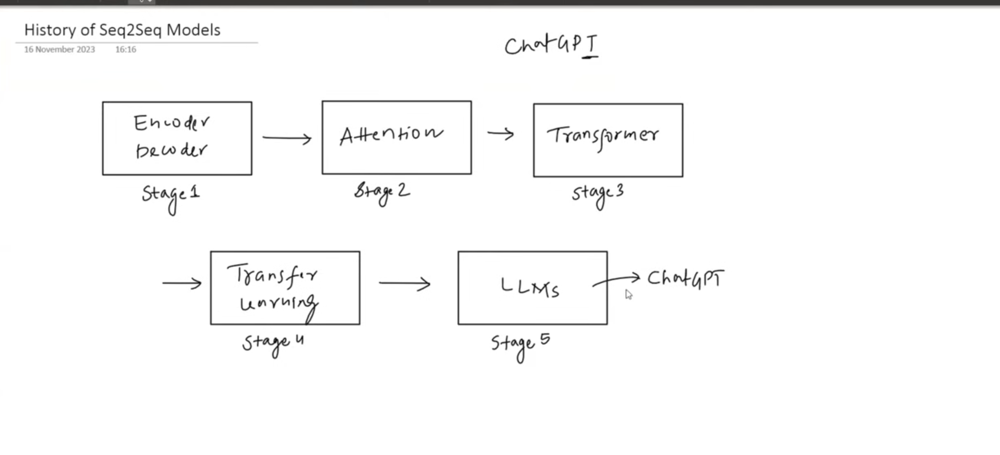

## Topic 2: Stage 1 – The Encoder-Decoder Architecture (2014)
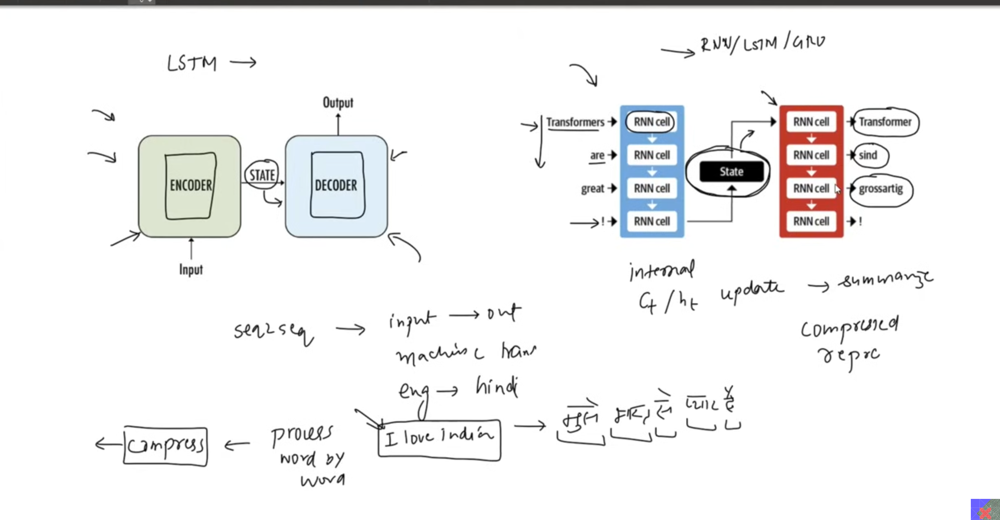
### 1. Introduction
**What it is:** The Encoder-Decoder architecture was the first major solution proposed specifically to solve the "Many-to-Many" asynchronous sequence problem—where the input and output sequences have different lengths. It was introduced in the seminal 2014 paper *"Sequence to Sequence Learning with Neural Networks"* by a team led by Ilya Sutskever (now co-founder of OpenAI).

**Why it's important:** This architecture was the foundation upon which modern LLMs were built. It was the first successful attempt to handle tasks like machine translation using deep learning, demonstrating that neural networks could map one sequence to another of arbitrary length.

**Real-life use:** Machine translation (e.g., English to Hindi), text summarization, and question-answering systems.

### 2. Detailed Explanation
#### The Core Idea
The architecture consists of two main parts:

1.  **Encoder:** Processes the input sequence (e.g., an English sentence) word-by-word. It compresses all the information from the entire sentence into a single, fixed-length vector called the **Context Vector**.
2.  **Decoder:** Takes the Context Vector from the encoder and uses it to generate the output sequence (e.g., the Hindi translation) step-by-step.

Think of it like this: The encoder reads an entire book and summarizes it into one page (the Context Vector). The decoder then reads that one-page summary and rewrites the book in a different language.

#### How It Works (Step-by-Step)
1.  The encoder is typically an LSTM (or GRU/RNN) cell.
2.  The input sentence (e.g., "I love India") is fed word-by-word into the encoder.
3.  At each time step, the LSTM updates its internal state (Cell State and Hidden State), storing information about the words it has seen so far.
4.  After the last word ("India") is processed, the final hidden state of the encoder becomes the **Context Vector**. This vector represents the "summary" of the entire input sentence.
5.  The context vector is passed to the decoder, which is also an LSTM cell.
6.  The decoder starts generating the output sequence one word at a time (e.g., "Main", "India", "se", "pyar", "karta", "hun").

#### The Fatal Flaw (Which Led to the Next Stage)
While this architecture worked well for short sentences, it failed for long ones. The problem lies in the **Context Vector**.

- The encoder has to compress *all* information from a potentially very long sentence into a single, fixed-length vector.
- The decoder relies *solely* on this context vector to generate the entire translation.
- Due to the short-term memory problem of LSTMs, the context vector struggles to retain information from the beginning of a long sentence. The network tends to "forget" the early words.
- **Experimental Evidence:** Research showed that translation quality (measured by BLEU scores) degraded significantly once the input sentence exceeded **30 words**.

### 3. Key Points
- The Encoder-Decoder was the first solution for variable-length sequence-to-sequence tasks.
- It consists of an **Encoder** (processes input) and a **Decoder** (generates output).
- The encoder compresses the entire input into a **Context Vector**.
- The decoder uses this single context vector for every step of the output.
- **Critical Failure:** It performs poorly on long sentences (>30 words) because the context vector cannot hold all the information.

### 4. Syntax/Structure (Conceptual Architecture)
- **Input:** "Transformers Are Great" (3 words).
- **Encoder (LSTM):** Word 1 ("Transformers") → Update State → Word 2 ("Are") → Update State → Word 3 ("Great") → Update State → **Final State = Context Vector**.
- **Decoder (LSTM):** Context Vector → Generate Word 1 → Generate Word 2 → Generate Word 3 → Generate Word 4 (if needed), etc.

### 5. Code Examples
*Note: The transcript does not provide code, but the conceptual architecture is:*

```python
# Conceptual idea (not actual runnable code)
encoder = LSTM()
for word in input_sentence:  # "I", "love", "India"
    encoder_state = encoder.update(word)

context_vector = encoder_state  # Final state after the last word

decoder = LSTM(initial_state=context_vector)
for step in range(output_length):
    next_word = decoder.generate()
```

### 7. Common Mistakes
- **Assuming the Context Vector is perfect:** Beginners often think the context vector stores all information flawlessly. The key point is that it *fails* to do so for long sequences.
- **Confusing Encoder and Decoder Roles:** The encoder is for *understanding* the input. The decoder is for *generating* the output. They are not the same unit.

### 8. Interview/Exam Questions
**Q1: What is the main problem with the original Encoder-Decoder architecture?**
**A1:** The main problem is the fixed-length **Context Vector**. It forces the encoder to compress all information from the input sequence into a single vector. For long sequences (>30 words), the vector loses information from the beginning of the sequence, leading to poor translation quality.

**Q2: What is the role of the context vector in the Encoder-Decoder model?**
**A2:** The context vector is the final hidden state of the encoder. It acts as a compressed summary of the entire input sequence and is passed to the decoder to initialize its states and guide the generation of the output sequence.

### 9. Revision Notes
- **Encoder:** Reads input, creates a **Context Vector** (a summary).
- **Decoder:** Uses Context Vector to generate output word-by-word.
- **Invented:** 2014 by Ilya Sutskever and team.
- **Core Problem:** Context vector is a "bottleneck"; it fails for long sentences (>30 words) due to "forgetting" early inputs.
- **This problem paved the way for the Attention Mechanism.**

---



## Topic 3: Stage 2 – The Attention Mechanism (2015)
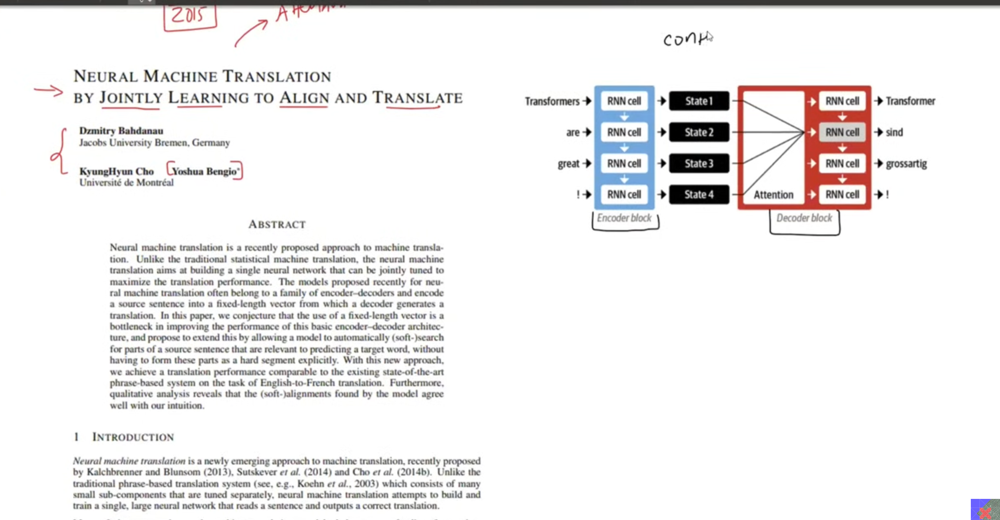
### 1. Introduction
**What it is:** The Attention Mechanism was introduced in the 2015 paper *"Neural Machine Translation by Jointly Learning to Align and Translate"* by Dzmitry Bahdanau and his team. It solved the Encoder-Decoder's "context vector bottleneck" by allowing the decoder to "look back" at all parts of the input sentence when generating each output word.

**Why it's important:** This was a breakthrough innovation. Instead of forcing everything into one fixed vector, Attention lets the model dynamically decide which parts of the input are most relevant for each output word. It dramatically improved translation quality for long sentences.

**Real-life use:** Modern machine translation (Google Translate), text summarization, and almost every sequence-to-sequence task today uses some form of attention.

### 2. Detailed Explanation
#### The Core Idea: Dynamic Context Vectors
In the old Encoder-Decoder, the decoder used the **same** context vector for every output word. In the Attention-based model, the decoder calculates a **unique** context vector for each output step. This context vector is a weighted combination of **all** the hidden states of the encoder, not just the final one.

Think of it like this: When you translate a sentence, you don't remember the entire sentence at once. You focus on the specific word you are translating right now. If you're translating the first word, you focus on the first part of the input. If you're translating the last word, you focus on the last part.

#### How It Works (Step-by-Step)
1.  **Encoder Stores All Hidden States:** Instead of discarding the intermediate hidden states, the encoder stores the hidden state from *every* time step (after processing each word).
2.  **Decoder Step 1 (First Output Word):** Before generating the first word, the decoder doesn't just look at one context vector. It looks at the attention layer.
3.  **The Attention Layer:** This layer receives:
    - All the encoder's hidden states.
    - The decoder's current state.
    It calculates a "score" or "similarity" for every encoder hidden state, determining which one is most relevant for predicting the current output word.
4.  **Creating the Unique Context Vector:** The attention layer computes a weighted sum of all encoder hidden states. The hidden state with the highest score gets the most weight. This weighted sum becomes the **unique context vector** for this specific output step.
5.  **Repeat for Each Output Word:** For each new word the decoder needs to generate, it repeats this process. It looks at all the encoder hidden states again and calculates a brand new unique context vector tailored to that specific output step.

**Result:** For the first word ("Main"), the attention mechanism will heavily focus on the first encoder hidden state (representing "I"). For the last word ("hun"), it will focus on the last encoder hidden state (representing "India"). This ensures no part of the sentence is forgotten.

### 3. Key Points
- The Attention Mechanism solves the "forgetting" problem of the original Encoder-Decoder.
- Instead of **one** context vector, it creates a **unique** context vector for every decoder time step.
- It does this by looking at **all** encoder hidden states and giving higher weight ("attention") to the most relevant ones.
- **Downside (Major Flaw):** It is computationally expensive. It requires calculating similarity scores for every pair of input and output words (N × M computations), leading to **Quadratic Complexity**. This significantly increases training time.

### 4. Syntax/Structure (Conceptual Diagram)
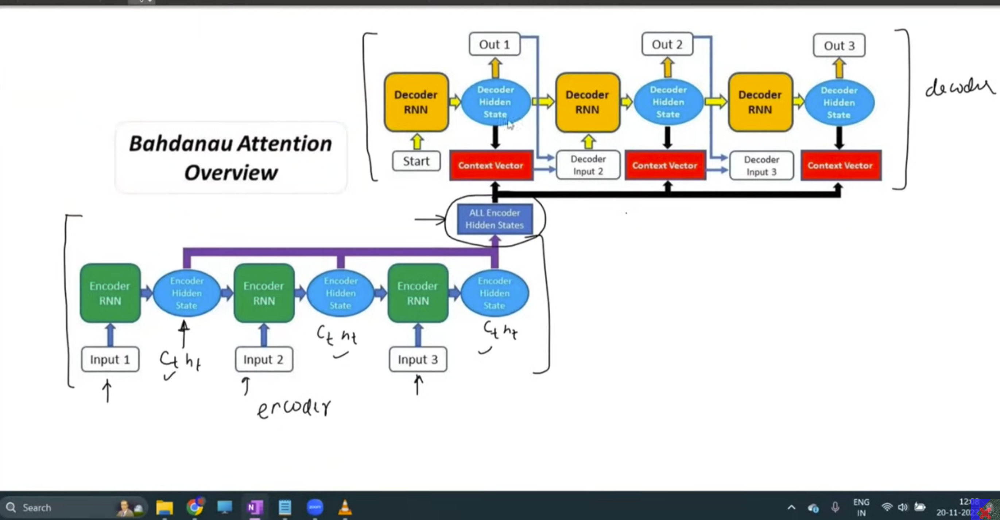
- **Encoder:** Word 1 → Hidden State 1; Word 2 → Hidden State 2; ...; Word N → Hidden State N. (All are stored).
- **Decoder (for Word 1):**
    1.  Take Hidden States 1...N.
    2.  Pass them to the Attention Layer with the current decoder state.
    3.  Attention Layer calculates scores and creates Context Vector 1 (heavily weighted towards Hidden State 1).
    4.  Use Context Vector 1 to generate Output Word 1.
- **Decoder (for Word 2):**
    1.  Repeat step 2, but this time the Attention Layer creates Context Vector 2 (heavily weighted towards Hidden State 2).

### 7. Common Mistakes
- **Thinking Attention adds more memory:** The attention mechanism doesn't add memory; it cleverly uses the hidden states that were already there but previously discarded.
- **Overlooking the computational cost:** Beginners often miss that the main problem with Attention is its slow training time due to the quadratic nature of the calculations (N words × M outputs).

### 8. Interview/Exam Questions
**Q1: How does the Attention Mechanism improve upon the basic Encoder-Decoder model?**
**A1:** The basic Encoder-Decoder uses a single context vector for the entire decoding process, which fails for long sentences. The Attention Mechanism, however, uses a unique context vector for each decoding step, allowing the model to "focus" on the most relevant parts of the input sequence at each output step. This effectively solves the "forgetting" problem.

**Q2: What is a major disadvantage of the attention mechanism?**
**A2:** A major disadvantage is its computational complexity. To calculate the context vector for each decoder time step, the model must compute similarity scores with all encoder hidden states. This results in an N×M quadratic complexity, significantly increasing the training time.

### 9. Revision Notes
- **Problem Solved:** Encoder-Decoder's fixed-context vector (forgets long sentences).
- **Solution:** Attention Mechanism dynamically focuses on relevant input words for each output word.
- **Mechanism:** Uses all encoder hidden states to create a unique context vector per output step.
- **The Trade-off:** It solves the accuracy problem but introduces a **computational bottleneck** (quadratic complexity).
- **This bottleneck led to the development of the Transformer.**

---



## Topic 4: Stage 3 – The Transformer Architecture (2017)
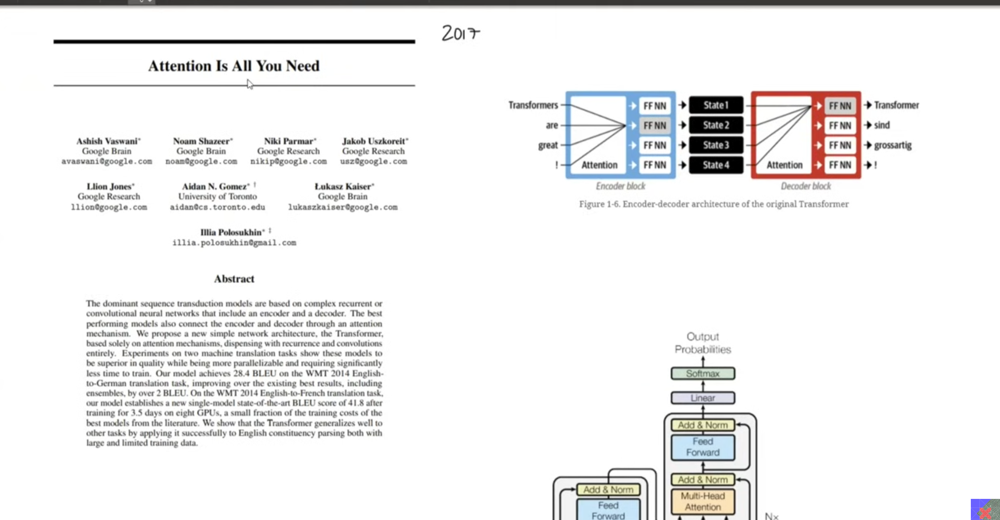
### 1. Introduction
**What it is:** The Transformer is a revolutionary neural network architecture introduced in the 2017 paper *"Attention Is All You Need"*. It completely abandoned the use of LSTMs and RNNs, relying **solely** on a new type of attention called **Self-Attention**.

**Why it's important:** This was the single most groundbreaking shift in NLP. Transformers addressed the biggest bottleneck of the attention mechanism: its slow training speed due to sequential processing. By introducing parallel processing, Transformers made it possible to train models on massive datasets in a fraction of the time. The "T" in **ChatGPT** stands for **Transformer**.

**Real-life use:** Almost every state-of-the-art NLP model today (GPT, BERT, etc.) is based on the Transformer architecture.

### 2. Detailed Explanation
#### The Core Problem with Previous Models
Before Transformers, even with attention, models relied on LSTMs (or RNNs). These process data **sequentially**—word 1, then word 2, then word 3. You cannot process word 3 before word 2. This sequential nature is inherently slow, even with attention.

#### The Transformer's Core Idea: Parallel Processing
The Transformer architecture **removes all recurrent cells (LSTMs/RNNs) entirely**. Instead, it uses a new mechanism called **Self-Attention**.

- **Self-Attention:** Unlike the earlier attention mechanism where the decoder "looked back" at the encoder, Self-Attention allows the model to look at **all other words in the same sentence** to understand the context of a specific word.

For example, in the sentence "The animal didn't cross the street because **it** was too tired", Self-Attention helps the model understand that "it" refers to "animal" by comparing "it" to every other word in the sentence simultaneously.

#### The Biggest Advantage: Parallelization
1.  Because there is no LSTM processing words one-by-one, the Transformer can process **all words in a sequence at the same time** (in parallel).
2.  This parallel processing dramatically reduces training time. Training Transformers is significantly faster and requires less computational hardware (GPUs) compared to previous sequential models.

#### The Resulting Architecture (High-Level)
The Transformer still retains an **Encoder** and a **Decoder** block, but they are built differently:

- **Encoder Block:** Uses Self-Attention layers and Feed-Forward (Dense) layers. No LSTMs.
- **Decoder Block:** Uses Self-Attention layers and Feed-Forward layers. No LSTMs.

### 3. Key Points
- The Transformer introduced **Self-Attention**.
- It completely **removes LSTM/RNN cells**, eliminating the sequential bottleneck.
- **Parallel Processing** is the key feature: all words are processed at once, making training very fast and cost-effective.
- The architecture still has Encoder and Decoder blocks but uses attention and dense layers instead of recurrent cells.

### 4. Syntax/Structure (Conceptual Architecture)
*Note: The transcript describes it at a high level:*
- **Input:** Embedding Layer → **Self-Attention Layer** → Normalization → Feed-Forward (Dense) Layer → Output.
- The architecture includes Encoder (left side) and Decoder (right side) stacks, but both use Self-Attention rather than LSTM.

### 7. Common Mistakes
- **Thinking Transformers don't use attention:** They are entirely based on attention (Self-Attention). The paper title is literally "Attention Is All You Need".
- **Confusing Self-Attention with earlier attention:** Earlier attention was used between the encoder and decoder. Self-Attention is used *within* the encoder or decoder to relate different parts of the same input.

### 8. Interview/Exam Questions
**Q1: What is the most significant difference between the Transformer architecture and the earlier Attention-based Encoder-Decoder models (like Bahdanau's)?**
**A1:** The most significant difference is that the Transformer completely removes recurrent networks (LSTMs/RNNs). The earlier Attention-based models still used LSTMs for sequential processing, which was slow. The Transformer uses **Self-Attention** and processes all words in parallel, making it much faster to train.

**Q2: What is Self-Attention, and why is it important?**
**A2:** Self-Attention is a mechanism where a model looks at every other word in the same sentence to understand the context of a specific word. It is important because it allows the Transformer to capture long-range dependencies and relationships within a sentence without relying on sequential processing.

### 9. Revision Notes
- **Paper:** "Attention Is All You Need" (2017).
- **Key Innovation:** **Self-Attention** for parallel processing.
- **Problem Solved:** Slow training time of LSTM-based attention models.
- **Result:** Training faster, cheaper, and state-of-the-art results.
- **However:** A new problem arose—training Transformers from scratch requires huge datasets and significant resources.

---



## Topic 5: Stage 4 – Transfer Learning & ULM-FiT (2018)
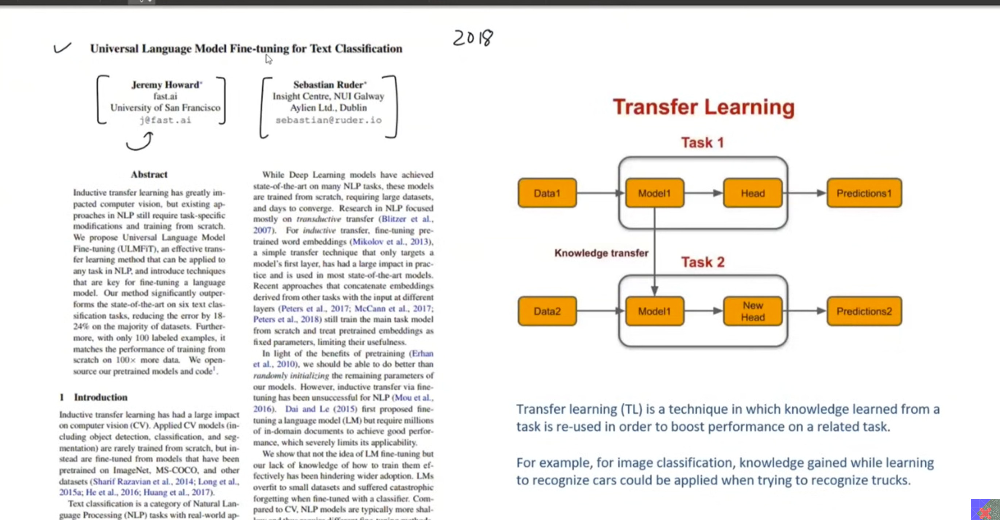
### 1. Introduction
**What it is:** Transfer Learning is a machine learning technique where knowledge gained from one task is reused to improve performance on a related task. In 2018, the paper *"Universal Language Model Fine-tuning (ULM-FiT)"* by Jeremy Howard and Sebastian Ruder successfully applied transfer learning to NLP for the first time.

**Why it's important:** Before ULM-FiT, training a model like a Transformer from scratch required massive amounts of labeled data and resources, making it inaccessible. Transfer learning changed this. It allowed practitioners to take a pre-trained model (trained on a huge general dataset) and fine-tune it on their smaller, specific datasets, achieving excellent results with much less data.

**Real-life use:** This is how most modern AI applications work. Companies don't train GPT from scratch; they take an existing pre-trained model and fine-tune it for their specific task (e.g., legal document analysis, medical diagnosis from text).

### 2. Detailed Explanation
#### What is Transfer Learning? (Quick Revision)
Transfer Learning is a two-step process:

1.  **Pre-training:** A model is trained on a very large, general dataset (like millions of images or billions of text words) to learn general features (e.g., edges in images, grammar and word relationships in text). This takes a lot of time and resources.
2.  **Fine-tuning:** The pre-trained model is then adapted to a specific, smaller dataset (e.g., 100 images of cats vs. dogs). The initial layers (which learned general features) are kept frozen, and only the later layers are re-trained on the new dataset. This is fast and requires little data.

#### Why Transfer Learning Wasn't Used in NLP Before 2018
Transfer learning was already popular in Computer Vision (e.g., using ImageNet pre-trained models), but it failed to work well in NLP for two reasons:

| Problem | Explanation |
| :--- | :--- |
| **Task Specificity** | NLP tasks (sentiment analysis, translation, question answering, NER) were considered too different from each other. It was believed a model trained on one task couldn't help with another. |
| **Lack of Data** | Pre-training requires massive datasets. Models needed **labeled** data for tasks like machine translation (English→Hindi pairs). Obtaining such huge labeled datasets was extremely difficult and expensive. |

#### How ULM-FiT Solved These Problems
The ULM-FiT researchers made two clever changes:

1.  **Changed the Pre-training Task:** Instead of using Machine Translation (which needs labeled data), they used **Language Modeling** as the pre-training task.
    - **Language Modeling:** This is the task of predicting the next word in a sentence (e.g., "I live in ___"). It is an **unsupervised** task because text data is unlabeled—we already naturally know the next word from the text itself.
    - This made it incredibly easy to gather data. You can just download any text (Wikipedia, books, websites) and use it for training. You don't need human annotators.

2.  **Benefits of Language Modeling as a Pre-training Task:**
    - **Rich Feature Learning:** Predicting the next word forces the model to learn grammar, syntax, and even common-sense reasoning (e.g., if the sentence is positive, the next word is likely positive). This deep understanding of the language is highly transferable to other tasks.
    - **Huge Data Availability:** Since no labels are needed, virtually any text data on the internet can be used. This was a game-changer.

#### ULM-FiT's Achievement
The researchers used a variant of an LSTM (called AWD-LSTM) and pre-trained it on Wikipedia text using the language modeling task. They then fine-tuned this model on smaller datasets (like IMDb movie reviews). Their results were revolutionary:

- Using only **100** labeled examples for fine-tuning, their model performed better than a model trained from scratch on **10,000** labeled examples.
- This showed that transfer learning was incredibly powerful for NLP.

### 3. Key Points
- **Pre-training:** Model learns general language understanding on huge unlabeled data.
- **Fine-tuning:** Model is adapted to a specific task on smaller labeled data.
- ULM-FiT used **Language Modeling** (predict next word) as the pre-training task.
- Language Modeling is an **Unsupervised** task, meaning huge datasets are freely available.
- **Revolution:** It proved that with transfer learning, you could get state-of-the-art results with very little data.

### 4. Syntax/Structure (Conceptual Process)
- **Step 1 (Pre-training):** Train an AWD-LSTM on Wikipedia text. Task: Predict the next word.
- **Step 2 (Fine-tuning):** Change the output layer of the model to a classifier (e.g., sentiment analysis). Train only the new layers on a small dataset (e.g., 100 movie reviews).

### 7. Common Mistakes
- **Confusing Pre-training and Fine-tuning:** Pre-training is done by the creator of the model on a general dataset. Fine-tuning is what *you* do to adapt it to your specific use case.
- **Using a language model for text generation only:** Language models are primarily for pre-training. Their real power, as shown by ULM-FiT, comes from fine-tuning them for other tasks like classification.

### 8. Interview/Exam Questions
**Q1: Why was Transfer Learning historically difficult to apply in NLP compared to Computer Vision?**
**A1:** It was difficult for two reasons. First, there was a perception that NLP tasks were too specific and differed greatly, so a model trained on one task wouldn't help another. Second, there was a lack of large, high-quality labeled datasets (like ImageNet in vision) to perform effective pre-training on language tasks.

**Q2: Why was Language Modeling chosen as the pre-training task in ULM-FiT?**
**A2:** Language Modeling (predicting the next word) was chosen because it is an **unsupervised** task. It doesn't require any labeled data. Since text is abundant and free on the internet, the researchers could build massive training datasets. Additionally, learning to predict the next word forces the model to learn important features of the language, like grammar and context, which are useful for many downstream tasks.

### 9. Revision Notes
- **Problem:** Training from scratch required tons of labeled data.
- **Solution:** Transfer Learning.
- **Key Paper:** ULM-FiT (2018).
- **Pre-training Task:** Language Modeling (predict next word).
- **Key Advantage:** Unsupervised → Unlimited data available.
- **Result:** Fine-tuning with 100 examples outperforms training from scratch with 10,000 examples.
- **Crucial Link:** The next stage combined this Transfer Learning approach with the Transformer architecture.

---



## Topic 6: Stage 5 – Large Language Models (LLMs) & The Journey to ChatGPT

### 1. Introduction
**What it is:** Large Language Models (LLMs) are massive Transformer-based models trained on enormous datasets using the transfer learning approach (pre-training on language modeling, then fine-tuning). Examples include Google's BERT and OpenAI's GPT series. The final stage of our history covers how we got from BERT/GPT to the global phenomenon, **ChatGPT**.

**Why it's important:** This is the culmination of all the prior stages. The combination of the Transformer architecture (parallel processing) and Transfer Learning (pre-training on huge data) created models so powerful they are considered a paradigm shift in AI. ChatGPT, in particular, demonstrated that an LLM could have human-like conversations, bringing AI into the mainstream.

**Real-life use:** ChatGPT, Bing Chat, Claude, Bard, and various other chatbots and AI assistants are all applications built on top of LLMs.

### 2. Detailed Explanation
#### The Creation of the First True LLMs (2018)
Around 10 months after ULM-FiT, two major models were released:
- **BERT (from Google):** An Encoder-Only model.
- **GPT (from OpenAI):** A Decoder-Only model.

Both were basically Language Models trained on the Transformer architecture. Because they used Transformers and were pre-trained on massive datasets, they excelled at transfer learning. Anyone could download these models and fine-tune them on their own small datasets to get state-of-the-art results. This completely transformed the NLP field.

#### What Makes a Language Model "Large" (LLM)?
The transcript outlines five key aspects that differentiate an LLM from a standard language model:

| Aspect | Description | Example (GPT-3) |
| :--- | :--- | :--- |
| **1. Data** | Trained on huge datasets (billions of words) with extreme diversity (eBooks, websites, Reddit, etc.) to reduce bias. | Trained on ~**45 terabytes** of text data. |
| **2. Hardware** | Requires clusters of thousands of GPUs for distributed computing. | Trained on a supercomputer with thousands of GPUs. |
| **3. Training Time** | Takes days to weeks to train, even with powerful hardware. | Takes a significant amount of time (weeks). |
| **4. Cost** | Extremely expensive. Costs millions of dollars (hardware, electricity, infrastructure, expert human labor). | Cost ~$10-20 million to train. |
| **5. Energy** | Consumes massive amounts of energy. | Training GPT-3 consumed as much energy as a small town uses in a month. |

**In short:** Because training an LLM from scratch is prohibitively expensive, only large companies, governments, or well-funded institutes can do it.

#### GPT vs. ChatGPT
**They are not the same.**

- **GPT is the Model:** It is the core language model (the "brain").
- **ChatGPT is the Application:** It is the user-friendly chatbot app built on top of the GPT model.

Think of it like this: **GPT is the Intel processor**, and **ChatGPT is the HP laptop** that uses that processor. You can have many different applications using the same GPT model (e.g., Jasper, You.com, Bing Chat) just like you can have many laptops from different brands using the same Intel processor.

#### How Did OpenAI Make ChatGPT (from GPT-3)?
The transcript explains the key steps OpenAI took to turn the raw GPT-3 model into the conversational ChatGPT:

1.  **Supervised Fine-Tuning:** Instead of just unsupervised pre-training, OpenAI gathered a large dataset of human conversations. They fine-tuned GPT-3 on this data to teach it how a human responds in a dialogue.

2.  **Reinforcement Learning from Human Feedback (RLHF) - The "Secret Sauce":**
    - GPT was asked to generate multiple responses to the same prompt.
    - Human annotators ranked these responses from best to worst.
    - This ranking data was used to train a "reward model" that learns what humans consider a good answer.
    - GPT was then fine-tuned using reinforcement learning to maximize this reward, essentially teaching it to please human users.

3.  **Improved Context Retention:** ChatGPT was specifically improved to remember the context of a conversation. It can recall what was said a few questions ago, which is crucial for a natural dialogue.

4.  **Incorporated Safety & Ethical Guidelines:** OpenAI trained the model to avoid providing harmful or unsafe responses (e.g., refusing to answer "how to make a bomb").

5.  **Continuous Improvement:** OpenAI actively collects user feedback (thumbs up/down buttons) and uses it to continuously improve and refine the model.

### 3. Key Points
- **BERT (Encoder-Only) and GPT (Decoder-Only)** were the first major LLMs.
- LLMs are massive due to data size, hardware needs, cost, and energy consumption.
- **GPT** is the underlying model; **ChatGPT** is the application built with it.
- ChatGPT was created from GPT-3 through:
    1. Supervised Fine-Tuning (on dialogue data).
    2. **RLHF (Reinforcement Learning from Human Feedback):** Teaching the model what humans like.
    3. Improved Context Retention.
    4. Safety and Ethical Guardrails.
    5. Continuous feedback loops.

### 4. Syntax/Structure
*Note: There is no syntax in this conceptual section. The focus is on the components of an LLM.*
- **Model (GPT):** The core neural network with 175 billion parameters.
- **Application (ChatGPT):** The chat interface that uses the GPT model.

### 7. Common Mistakes
- **Equating GPT and ChatGPT:** This is a very common mistake. ChatGPT is just one application. GPT is the engine. Other applications like Jasper or Bing Chat also use GPT under the hood.
- **Thinking you can train your own GPT-3:** As explained in the "Large" section, training a model like GPT-3 from scratch requires millions of dollars and huge expertise. You are expected to fine-tune existing models, not build them from scratch.

### 8. Interview/Exam Questions
**Q1: Distinguish between GPT and ChatGPT.**
**A1:** GPT is the foundational language model—the core technology. ChatGPT is a specific application built on top of the GPT model. It is a chatbot interface that has been fine-tuned on conversational data, using techniques like RLHF to produce human-like responses. You can think of GPT as the engine and ChatGPT as the car.

**Q2: What is RLHF and why was it important for ChatGPT?**
**A2:** RLHF stands for Reinforcement Learning from Human Feedback. It was crucial for ChatGPT because it allowed the model to learn what humans consider a "good" or "helpful" response. By having humans rank different AI-generated answers, the model was trained to prioritize responses that are more accurate, relevant, and satisfying to the user, drastically improving its conversational quality.

**Q3: What are the five key aspects that define a "Large" Language Model?**
**A3:** The five key aspects are:
1.  **Data:** Trained on an enormous and diverse dataset (billions of words).
2.  **Hardware:** Requires powerful GPU clusters for distributed computing.
3.  **Training Time:** Takes days to weeks to complete.
4.  **Cost:** Extremely expensive to train (millions of dollars).
5.  **Energy:** Consumes an immense amount of electricity (e.g., small town's monthly usage).

### 9. Revision Notes
- **A New Era:** Transformers + Transfer Learning = LLMs.
- **First Major LLMs:** BERT (Encoder) & GPT (Decoder).
- **LLM Characteristics:** Massive data, hardware, time, cost, energy.
- **The Secret to ChatGPT:** **RLHF** (Reinforcement Learning from Human Feedback) - teaching the AI what humans like.
- **Key Difference:** GPT = Model; ChatGPT = Application.

---

**This concludes the entire history of LLMs as covered in the transcript.**

You have now completed all the topics. The history started with RNNs, moved to the Encoder-Decoder (which failed on long sentences), then Attention (which solved accuracy but was slow), then Transformers (which solved speed with parallel processing), then Transfer Learning (which solved the data problem), and finally LLMs/ChatGPT (which combined all of this with human feedback to create the revolution we see today).